In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import string
import re
from nltk.corpus import stopwords 
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize 
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import cross_validate

# First things first

Loading the data

In [2]:

data = pd.read_csv('../raw_data/mbti_1.csv')

data

,type,posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
1,ENTP,'I'm finding the lack of me in these posts ver...
2,INTP,'Good one _____ https://www.youtube.com/wat...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,'You're fired.|||That's another silly misconce...
...,...,...
8670,ISFP,'https://www.youtube.com/watch?v=t8edHB_h908||...
8671,ENFP,'So...if this thread already exists someplace ...
8672,INTP,'So many questions when i do these things. I ...
8673,INFP,'I am very conflicted right now when it comes ...


Now, let's inspect the data and see what it have for us

In [3]:
data.describe()

,type,posts
count,8675,8675
unique,16,8675
top,INFP,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
freq,1832,1


In [17]:
data.type.value_counts()

INFP    1832
INFJ    1470
INTP    1304
INTJ    1091
ENTP     685
ENFP     675
ISTP     337
ISFP     271
ENTJ     231
ISTJ     205
ENFJ     190
ISFJ     166
ESTP      89
ESFP      48
ESFJ      42
ESTJ      39
Name: type, dtype: int64

In [4]:
data['type'].nunique()

16

So, we have the 16 types correctly assigned as a classifier ✔

And lets see the distribution for them

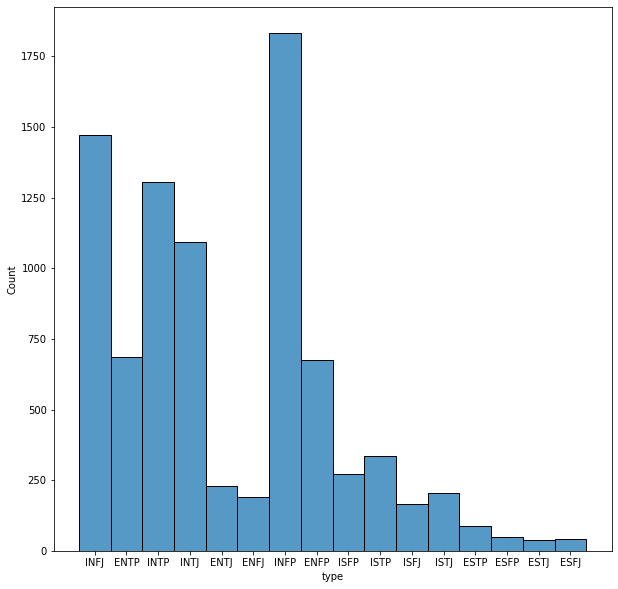

In [5]:
plt.figure(figsize=(10,10))
sns.histplot(data['type']);

And finally let's take a look into the content of the posts

In [6]:
data['posts'][0]

"'http://www.youtube.com/watch?v=qsXHcwe3krw|||http://41.media.tumblr.com/tumblr_lfouy03PMA1qa1rooo1_500.jpg|||enfp and intj moments  https://www.youtube.com/watch?v=iz7lE1g4XM4  sportscenter not top ten plays  https://www.youtube.com/watch?v=uCdfze1etec  pranks|||What has been the most life-changing experience in your life?|||http://www.youtube.com/watch?v=vXZeYwwRDw8   http://www.youtube.com/watch?v=u8ejam5DP3E  On repeat for most of today.|||May the PerC Experience immerse you.|||The last thing my INFJ friend posted on his facebook before committing suicide the next day. Rest in peace~   http://vimeo.com/22842206|||Hello ENFJ7. Sorry to hear of your distress. It's only natural for a relationship to not be perfection all the time in every moment of existence. Try to figure the hard times as times of growth, as...|||84389  84390  http://wallpaperpassion.com/upload/23700/friendship-boy-and-girl-wallpaper.jpg  http://assets.dornob.com/wp-content/uploads/2010/04/round-home-design.jpg ...

Just as described in the documentation of the data, here we have the last 50 things they have posted (Each entry separated by "|||" (3 pipe characters)), maybe we have a better performance splitting it into a more observations and try to add more weight for each classification

That's the code to split the comments into more rows, but seems to have a poor performance in the classification
``` 
my_list = []

for idi, p in data.to_numpy():
    post = p.split('|||')
    my_df = pd.DataFrame(post)
    my_df['type'] = idi
    my_list.append(my_df)
    
full_data = pd.concat(my_list)

full_data = full_data.rename(columns={0: 'post', 'type': 'type'}) 
```

## Preprocessing for NLP

Now that we have all the data properly divided, let's treat the strings for NLP analysis

In [7]:
def clean(text):
    sentence = re.sub('https?://[^\s<>"]+|www\.[^\s<>"]+', 'url',
                      text)  # Remove links
    for punctuation in string.punctuation:
        sentence = sentence.replace(punctuation, ' ')  # Remove Punctuation
    lowercased = sentence.lower()  # Lower Case
    tokenized = word_tokenize(lowercased)  # Tokenize
    words_only = [word for word in tokenized
                  if word.isalpha()]  # Remove numbers
    stop_words = set(stopwords.words('english'))  # Make stopword list
    without_stopwords = [
        word for word in words_only if not word in stop_words
    ]  # Remove Stop Words
    lemma = WordNetLemmatizer()  # Initiate Lemmatizer
    lemmatized = [lemma.lemmatize(word)
                  for word in without_stopwords]  # Lemmatize
    return " ".join(lemmatized)  # Return as one string for post


# Apply to all texts
data['clean_text'] = data.posts.apply(clean)
data['clean_text'] = data['clean_text'].astype('str')

data.head()

,type,posts,clean_text
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,url intj moment url sportscenter top ten play ...
1,ENTP,'I'm finding the lack of me in these posts ver...,finding lack post alarming sex boring position...
2,INTP,'Good one _____ https://www.youtube.com/wat...,good one url course say know blessing curse ab...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",dear intp enjoyed conversation day esoteric ga...
4,ENTJ,'You're fired.|||That's another silly misconce...,fired another silly misconception approaching ...


Let's try to add a feature engineering to see if it helps the classification

In [8]:
def vocab_richness(text):
    tokens = word_tokenize(text)
    total_length = len(tokens)
    unique_words = set(tokens)
    unique_word_length = len(unique_words)
    return unique_word_length/total_length

data['vocab richness'] = data.posts.apply(vocab_richness)

data

,type,posts,clean_text,vocab richness
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,url intj moment url sportscenter top ten play ...,0.538462
1,ENTP,'I'm finding the lack of me in these posts ver...,finding lack post alarming sex boring position...,0.401968
2,INTP,'Good one _____ https://www.youtube.com/wat...,good one url course say know blessing curse ab...,0.476144
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",dear intp enjoyed conversation day esoteric ga...,0.410374
4,ENTJ,'You're fired.|||That's another silly misconce...,fired another silly misconception approaching ...,0.447952
...,...,...,...,...
8670,ISFP,'https://www.youtube.com/watch?v=t8edHB_h908||...,url always think cat fi doms reason url websit...,0.454451
8671,ENFP,'So...if this thread already exists someplace ...,thread already exists someplace else url heck ...,0.349854
8672,INTP,'So many questions when i do these things. I ...,many question thing would take purple pill pic...,0.478970
8673,INFP,'I am very conflicted right now when it comes ...,conflicted right come wanting child honestly m...,0.320827


Now let's normalize the data to avoid the bias created by the huge difference in the number of personalities

## Bag-of-Words modeling

Ok! Now lets make a bag-of-words to vectorize the words to put it in the models:

In [13]:
vectorizer = TfidfVectorizer(ngram_range = (2,2), min_df=0.01, max_df = 0.05)

X_bow = vectorizer.fit_transform(data.clean_text)

In [12]:
X_sum = X_bow.sum(axis=0)
score_list = X_sum.tolist()[0]

# Get the word and associated weight
score_df = pd.DataFrame({"word": vectorizer.get_feature_names_out(), "score":score_list})
score_df
# Sort
score_df.sort_values("score", ascending = False, inplace =True)
# Display the sorted list
score_df.head(20)

,word,score
44283,like,682.019897
77142,think,498.400029
57109,people,475.788051
54447,one,393.051804
42268,know,381.901937
81796,url,370.641171
62723,really,366.815278
85783,would,355.706806
77128,thing,351.513796
77639,time,338.500055


We can compute the most commons words for each type of MBTI

In [23]:
types = ['INTP', 'INTJ', 'ENTJ', 'ENTP', 'INFJ', 'INFP', 'ENFJ', 'ENFP', 'ISTJ', 'ISFJ', 'ESTJ',
         'ESFJ', 'ISTP', 'ISFP', 'ESTP', 'ESFP']
 
def words_count(data, mbti):
    df = data[data['type'].isin([mbti])]
    return df

my_list = []

for t in types:
    my_df = words_count(data, t)
    my_list.append(my_df)

words_for_type = pd.concat(my_list)

words_for_type

,type,posts,clean_text,vocab richness
2,INTP,'Good one _____ https://www.youtube.com/wat...,good one url course say know blessing curse ab...,0.476144
9,INTP,'https://www.youtube.com/watch?v=w8-egj0y8Qs||...,url position actually let go person due variou...,0.429535
14,INTP,'Basically this... https://youtu.be/1pH5c1Jkh...,basically url cheezburgr fond top hat certainl...,0.462076
15,INTP,"'Your comment screams INTJ, bro. Especially th...",comment scream intj bro especially useless par...,0.408638
20,INTP,'Steve Job's was recognized for his striving f...,steve job recognized striving efficiency pract...,0.453775
...,...,...,...,...
7366,ESFP,'Marathoning anime about MMO's. Sword Art Onli...,marathoning anime mmo sword art online game li...,0.410191
7376,ESFP,'I think she is a INFJ..What do you guys think...,think infj guy think dear infj dating almost y...,0.438596
7530,ESFP,'The Social 9 description fit me better than p...,social description fit better probably descrip...,0.439457
7804,ESFP,"'Here, have an INFJ.|||Lol. Nope.|||Rule 1: Ev...",infj lol nope rule everybody sensor intuitive ...,0.481106


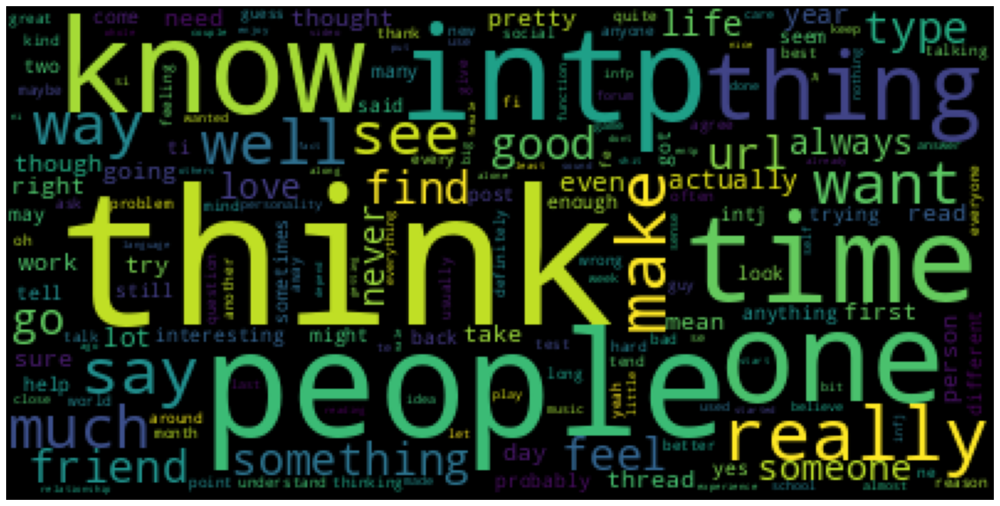

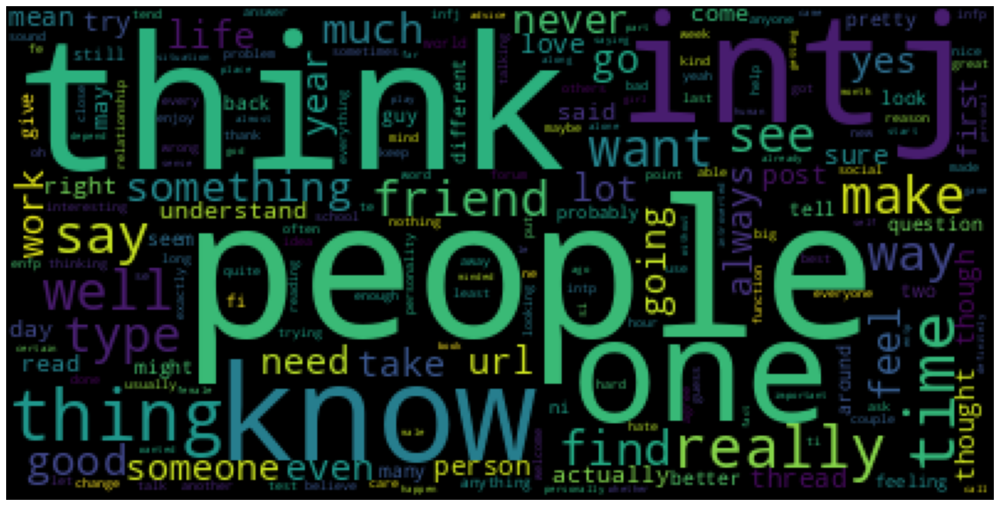

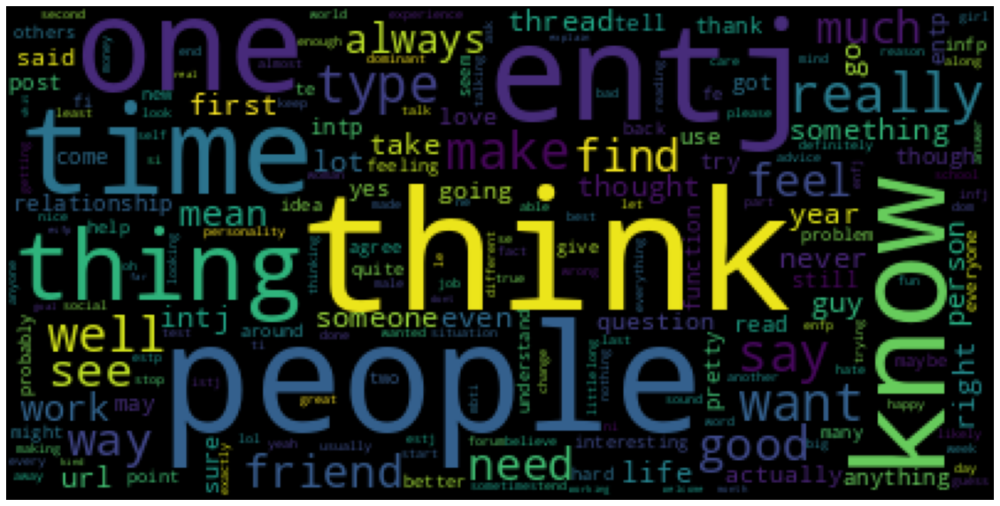

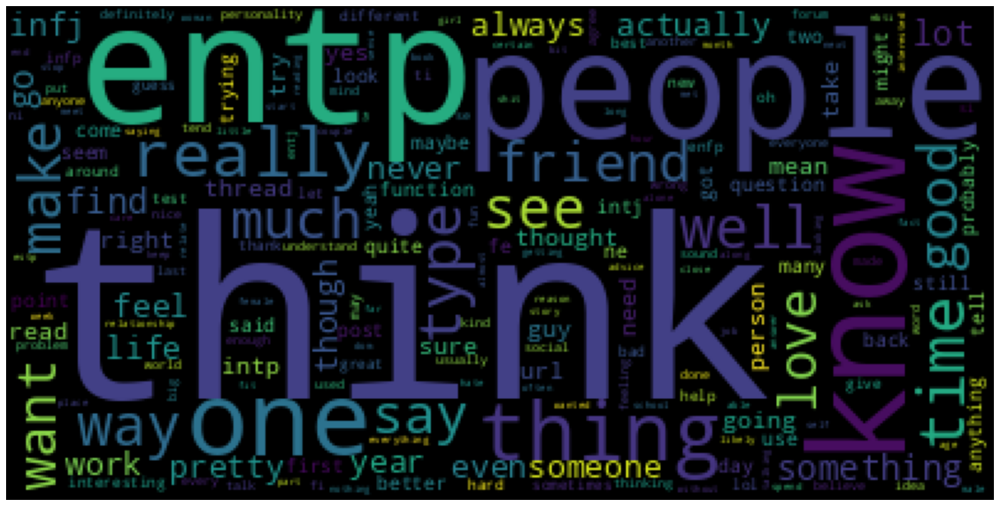

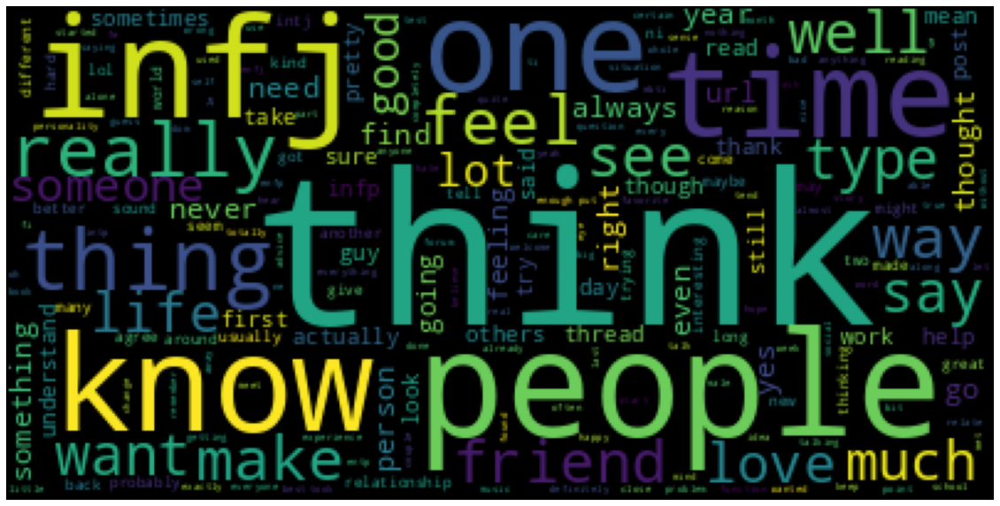

...

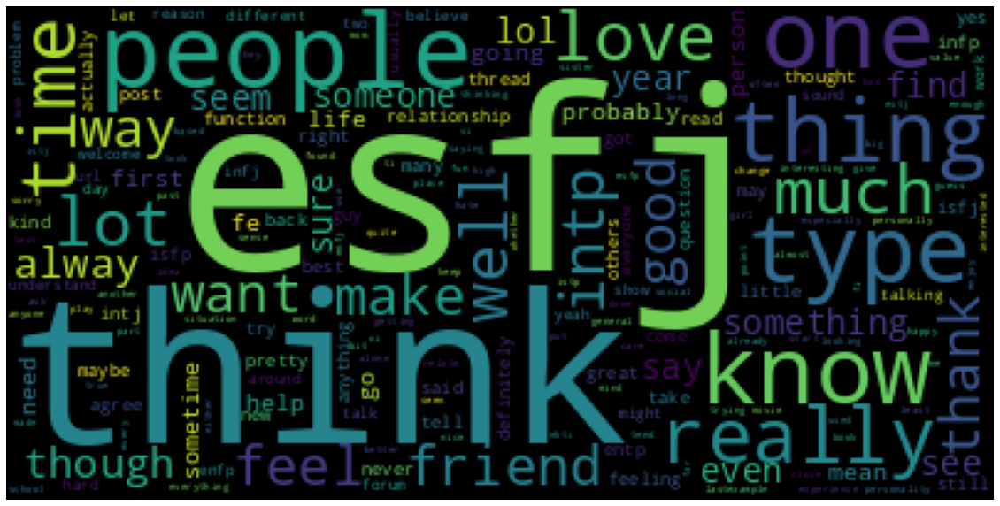

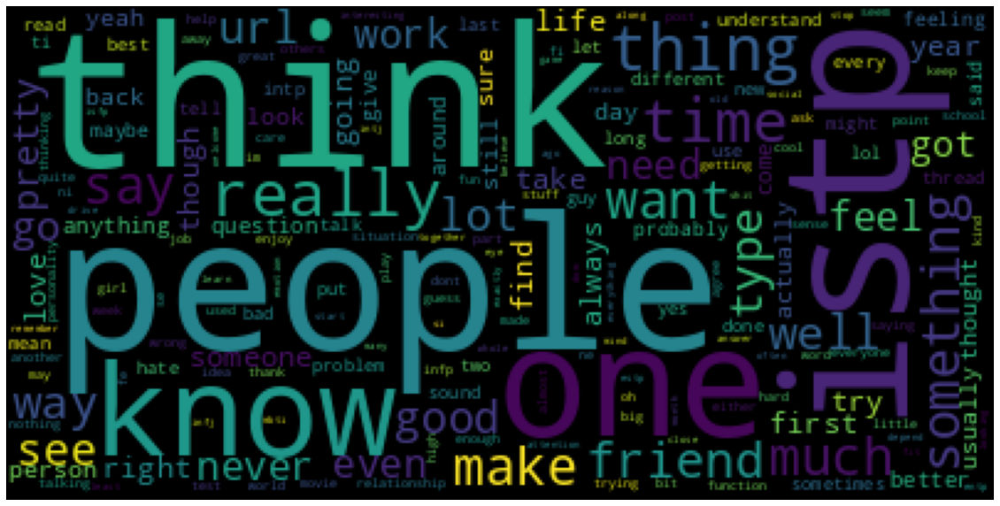

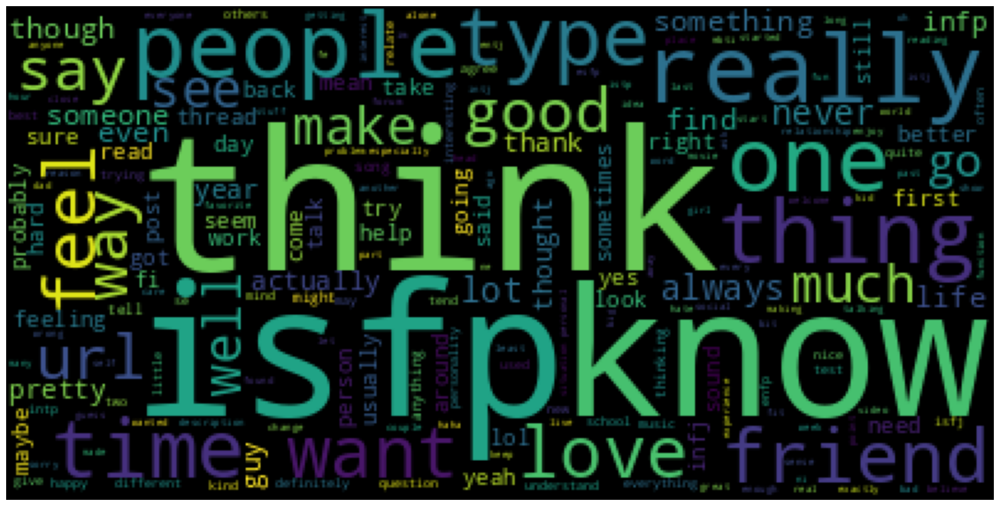

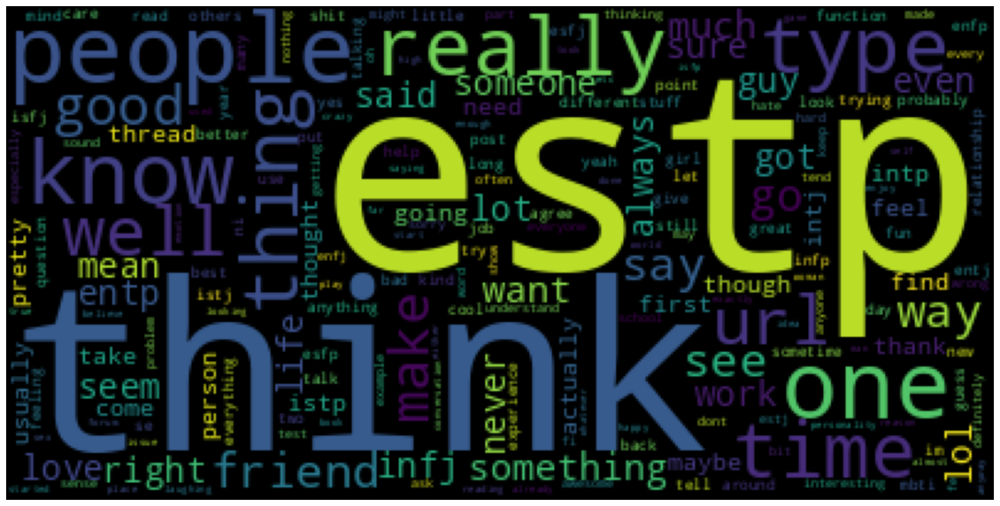

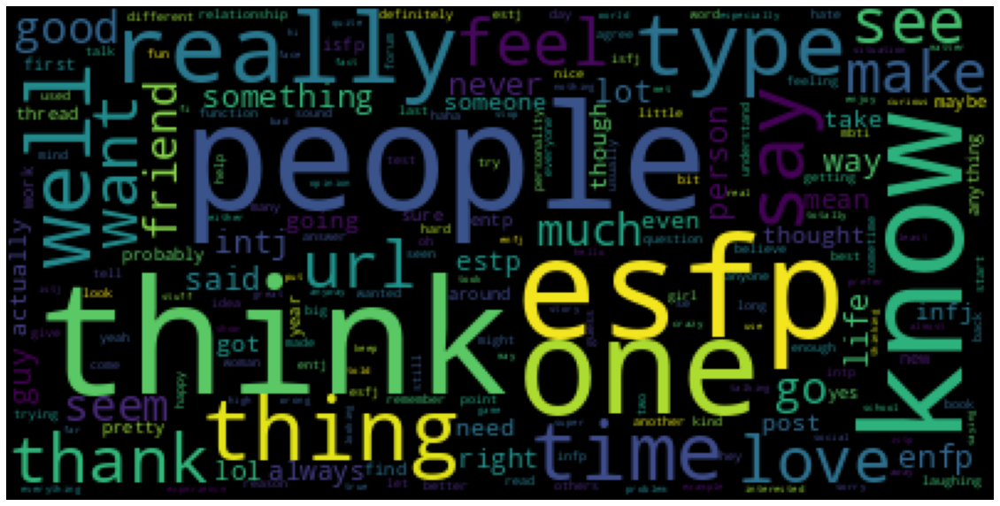

In [32]:
for typedf in my_list:
    vectorizer = TfidfVectorizer(ngram_range = (2,2), min_df=0.01, max_df = 0.05)
    X_bow = vectorizer.fit_transform(typedf['clean_text'])
    feature_names = vectorizer.get_feature_names_out()
    wc = WordCloud()
    wc.generate(' '.join(word for word in feature_names ))
    plt.figure(figsize=(20,15))
    plt.axis('off')
    plt.imshow(wc);

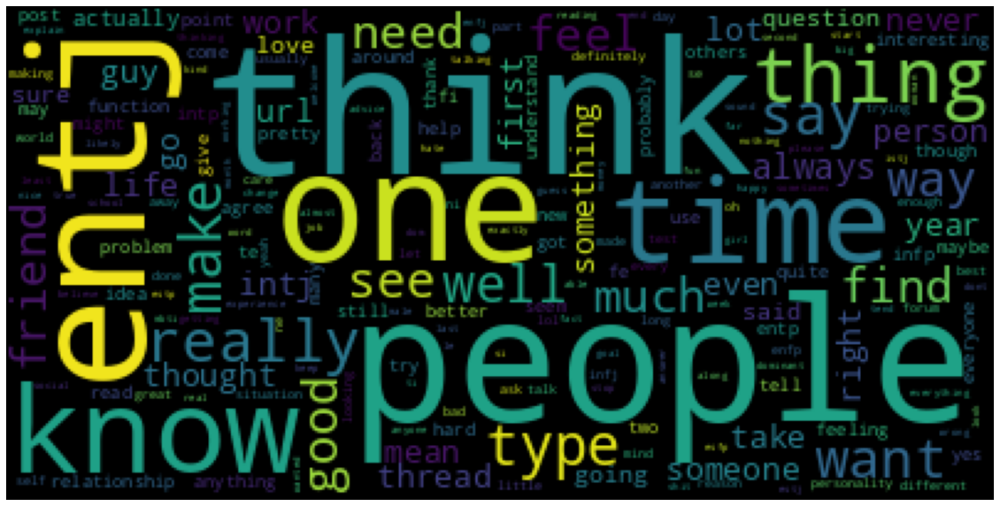

In [31]:
from wordcloud import WordCloud

vectorizer = TfidfVectorizer(ngram_range = (2,2), min_df=0.01, max_df = 0.05)
X_bow = vectorizer.fit_transform(my_list[2]['clean_text'])

feature_names = vectorizer.get_feature_names_out()
wc = WordCloud()
wc.generate(' '.join(word for word in feature_names ))
plt.figure(figsize=(20,15))
plt.axis('off')
plt.imshow(wc);

Well, it's seems we can a big job to improve the accuracy of the model. Let's try apply some improvements in the process of cleaning the data.

# Models

## Tuned MultinomialNB

In [ ]:
cv_nb = cross_validate( MultinomialNB(), X_bow, data.type, scoring = "accuracy")

cv_nb['test_score'].mean()

In [ ]:
vectorizer = TfidfVectorizer(ngram_range=(3,3) , min_df = 0, max_df=0.9)

X_bow = vectorizer.fit_transform(data.clean_text)

cv_nb = cross_validate(MultinomialNB(), X_bow, data.type, scoring="accuracy")

cv_nb['test_score'].mean()

Yeah, well, let's try others classifiers to see what we can get

## 